## Problem Statement 1

In the recent past, the industry of wealth management has seen a lot of growth. Individuals and businesses actively seek maximum returns. However, in many cases, they lack either the skills to identify the right investment opportunities or the time to find such opportunities. This challenge gave rise to the dedicated individuals who perform this task on behalf of the investors for a commission: portfolio managers.

 A portfolio manager makes investment decisions and carries out other related activities on behalf of vested investors. They work with a team of analysts and researchers, and their main objective is to realize the needs of the investor and suggest a suitable portfolio that meets all the expectations. They are responsible for establishing the best investment strategy and selecting appropriate investments with the right allocations. However, in doing so, they face a lot of competition in the form of other portfolio managers and rival firms. Therefore, the portfolio manager has to use the available resources to provide the best solution to the investor.

 Consider yourself working for an associate at an investment firm that manages accounts for private clients. Your role requires you to analyze a portfolio of stocks to provide consultation on investment management based on client requirements. Let us hear more about it from Joydeep as he introduces you to the entire case.


#### Business Requirement:
    
Being a portfolio manager, the task is to provide consultation to two different investors, considered as Private Clients, i.e., Mr. Patrick Jyengar and Mr. Peter Jyengar, based on their requirements and financial objectives

The primary goal of this Case Study:
1. To suggest a Portfolio of stocks to Mr. Patrick Jyengar based on his risk profile to meet his goal of doubling the amount of 500K Dollars in five years of timespan to buy a minority stake in Nature.
2. To provide a High-risk stock to Mr. Peter Jyengar based on his risk profile to accomplish his goal of earning greater returns for the invested amount of 1 Million Dollars. Over five years of timeframe to use it for the expansion of JWW.


In [106]:
#importing image library
from IPython.display import Image
Image("Annexure-I.png")

### Import Libraries 

In [107]:
#importing python libraries

import numpy as np
import pandas as pd
from collections import Counter
from functools import reduce
from datetime import datetime
from scipy import stats

#import standard plotly libraries
import plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

#Visualization Libraries
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
%matplotlib inline


# Machine Learning Libraries

#Sci-kit learn libraries

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error

### Suppress Warnings

In [108]:
# Importing warning so that the warning error is not visible every time.
import warnings
warnings.filterwarnings('ignore')

### Setting up Jupyter View 

In [109]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None

__________
## Reading & Understanding the data 

### Importing the datasets

Read the data from all 24 stocks and SP500 index.
File names are changed from abbreviation to company name to understand easily.

In [110]:
#importing the datasets

## AVIATION STOCKS DATASET
American_Airlines = pd.read_csv("AAL.csv")
Allegiant_Travel = pd.read_csv("ALGT.csv")
Alaska_Air = pd.read_csv("ALk.csv")
Delta_AirLines = pd.read_csv("DAL.csv")
Hawaiian_Holdings = pd.read_csv("HA.csv")
Southwest_Airlines = pd.read_csv("LUV.csv")

## FINANCE STOCKS DATASET
Barclays = pd.read_csv("BCS.csv")
Credit_Suisse = pd.read_csv("CS.csv")
Deutsche_Bank = pd.read_csv("DB.csv")
Goldman_Sachs = pd.read_csv("GS.csv")
Morgan_Stanley = pd.read_csv("MS.csv")
Wells_Fargo = pd.read_csv("WFC.csv")

## HEALTHCARE STOCKS DATASET
Johnson_and_Johnson = pd.read_csv("JNJ.csv")
Merck_and_CO = pd.read_csv("MRK.csv")
Pfizer = pd.read_csv("PFE.csv")
UnitedHealthGroup = pd.read_csv("UNH.csv")

## PHARMACEUTICAL STOCKS DATASET
Bausch_Health = pd.read_csv("BHC.csv")
Roche_Holding = pd.read_csv("RHHBY.csv")

## TECHNOLOGY STOCKS DATASET
Apple = pd.read_csv("AAPL.csv")
Amazon = pd.read_csv("AMZN.csv")
Facebook = pd.read_csv("FB.csv")
Alphabet = pd.read_csv("GOOG.csv")
IBM = pd.read_csv("IBM.csv")
Microsoft = pd.read_csv("MSFT.csv")

#S&P500 Index

SP500 = pd.read_csv("S&P500.csv")

In [111]:
#Displaying the first few rows of American Airlines stocks
American_Airlines.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,01-10-2010,9.29,9.39,9.21,9.29,8.758067,3603800
1,04-10-2010,9.24,9.48,9.05,9.12,8.597802,3856800
2,05-10-2010,9.27,9.35,9.15,9.23,8.701504,3896600
3,06-10-2010,9.27,9.40,9.15,9.23,8.701504,3230200
4,07-10-2010,9.30,9.31,9.07,9.24,8.710930,3877700


In [112]:
#Renaming the columns in the dataset and changing the close column to the stock name for easy reference

American_Airlines = American_Airlines.rename(columns = {'Open': 'AAL_Open', 'High': 'AAL_High','Low': 'AAL_Low','Close': 'AAL','Adj Close': 'AAL_Adj Close','Volume': 'AAL_Volume'}, inplace = False)
Allegiant_Travel = Allegiant_Travel.rename(columns = {'Open': 'ALGT_Open', 'High': 'ALGT_High','Low': 'ALGT_Low','Close': 'ALGT','Adj Close': 'ALGT_Adj Close','Volume': 'ALGT_Volume'}, inplace = False)
Alaska_AirLk = Alaska_Air.rename(columns = {'Open': 'ALk_Open', 'High': 'ALk_High','Low': 'ALk_Low','Close': 'ALk','Adj Close': 'ALk_Adj Close','Volume': 'ALk_Volume'}, inplace = False)
Delta_AirLines = Delta_AirLines.rename(columns = {'Open': 'DAL_Open', 'High': 'DAL_High','Low': 'DAL_Low','Close': 'DAL','Adj Close': 'DAL_Adj Close','Volume': 'DAL_Volume'}, inplace = False)
Hawaiian_Holdings = Hawaiian_Holdings.rename(columns = {'Open': 'HA_Open', 'High': 'HA_High','Low': 'HA_Low','Close': 'HA','Adj Close': 'HAL_Adj Close','Volume': 'HAL_Volume'}, inplace = False)
Southwest_Airlines = Southwest_Airlines.rename(columns = {'Open': 'LUV_Open', 'High': 'LUV_High','Low': 'LUV_Low','Close': 'LUV','Adj Close': 'LUV_Adj Close','Volume': 'LUV_Volume'}, inplace = False)

Barclays = Barclays.rename(columns = {'Open': 'BCS_Open', 'High': 'BCS_High','Low': 'BCS_Low','Close': 'BCS','Adj Close': 'BCS_Adj Close','Volume': 'BCS_Volume'}, inplace = False)
Credit_Suisse = Credit_Suisse.rename(columns = {'Open': 'CS_Open', 'High': 'CS_High','Low': 'CS_Low','Close': 'CS','Adj Close': 'CS_Adj Close','Volume': 'CS_Volume'}, inplace = False)
Deutsche_Bank= Deutsche_Bank.rename(columns = {'Open': 'DB_Open', 'High': 'DB_High','Low': 'DB_Low','Close': 'DB','Adj Close': 'DB_Adj Close','Volume': 'DB_Volume'}, inplace = False)
Goldman_Sachs = Goldman_Sachs.rename(columns = {'Open': 'GS_Open', 'High': 'GS_High','Low': 'GS_Low','Close': 'GS','Adj Close': 'GS_Adj Close','Volume': 'GS_Volume'}, inplace = False)
Morgan_Stanley = Morgan_Stanley.rename(columns = {'Open': 'MS_Open', 'High': 'MS_High','Low': 'MS_Low','Close': 'MS','Adj Close': 'MS_Adj Close','Volume': 'MS_Volume'}, inplace = False)
Wells_Fargo = Wells_Fargo.rename(columns = {'Open': 'WFC_Open', 'High': 'WFC_High','Low': 'WFC_Low','Close': 'WFC','Adj Close': 'WFC_Adj Close','Volume': 'WFC_Volume'}, inplace = False)

Johnson_and_Johnson = Johnson_and_Johnson.rename(columns = {'Open': 'JNJ_Open', 'High': 'JNJ_High','Low': 'JNJ_Low','Close': 'JNJ','Adj Close': 'JNJ_Adj Close','Volume': 'JNJ_Volume'}, inplace = False)
Merck_and_CO = Merck_and_CO.rename(columns = {'Open': 'MRK_Open', 'High': 'MRK_High','Low': 'MRK_Low','Close': 'MRK','Adj Close': 'MRK_Adj Close','Volume': 'MRK_Volume'}, inplace = False)
Pfizer = Pfizer.rename(columns = {'Open': 'PFE_Open', 'High': 'PFE_High','Low': 'PFE_Low','Close': 'PFE','Adj Close': 'PFE_Adj Close','Volume': 'PFE_Volume'}, inplace = False)
UnitedHealthGroup = UnitedHealthGroup.rename(columns = {'Open': 'UNH_Open', 'High': 'UNH_High','Low': 'UNH_Low','Close': 'UNH','Adj Close': 'UNH_Adj Close','Volume': 'UNH_Volume'}, inplace = False)

Bausch_Health = Bausch_Health.rename(columns = {'Open': 'BHC_Open', 'High': 'BHC_High','Low': 'BHC_Low','Close': 'BHC','Adj Close': 'BHC_Adj Close','Volume': 'BHC_Volume'}, inplace = False)
Roche_Holding = Roche_Holding.rename(columns = {'Open': 'RHHBY_Open', 'High': 'RHHBY_High','Low': 'RHHBY_Low','Close': 'RHHBY','Adj Close': 'RHHBY_Adj Close','Volume': 'RHHBY_Volume'}, inplace = False)

Apple = Apple.rename(columns = {'Open': 'AAPL_Open', 'High': 'AAPL_High','Low': 'AAPL_Low','Close': 'AAPL','Adj Close': 'AAPL_Adj Close','Volume': 'AAPL_Volume'}, inplace = False)
Amazon = Amazon.rename(columns = {'Open': 'AMZN_Open', 'High': 'AMZN_High','Low': 'AMZN_Low','Close': 'AMZN','Adj Close': 'AMZN_Adj Close','Volume': 'AMZN_Volume'}, inplace = False)
Facebook = Facebook.rename(columns = {'Open': 'FB_Open', 'High': 'FB_High','Low': 'FB_Low','Close': 'FB','Adj Close': 'FB_Adj Close','Volume': 'FB_Volume'}, inplace = False)
Alphabet = Alphabet.rename(columns = {'Open': 'GOOG_Open', 'High': 'GOOG_High','Low': 'GOOG_Low','Close': 'GOOG','Adj Close': 'GOOG_Adj Close','Volume': 'GOOG_Volume'}, inplace = False)
IBM = IBM.rename(columns = {'Open': 'IBM_Open', 'High': 'IBM_High','Low': 'IBM_Low','Close': 'IBM','Adj Close': 'IBM_Adj Close','Volume': 'IBM_Volume'}, inplace = False)
Microsoft = Microsoft.rename(columns = {'Open': 'MSFT_Open', 'High': 'MSFT_High','Low': 'MSFT_Low','Close': 'MSFT','Adj Close': 'MSFT_Adj Close','Volume': 'MSFT_Volume'}, inplace = False)

SP500 = SP500.rename(columns = {'Open': 'S&P500_Open', 'High': 'S&P500_High','Low': 'S&P500_Low','Close': 'S&P500','Adj Close': 'S&P500_Adj Close','Volume': 'S&P500_Volume'}, inplace = False)


Naming each column with a stock name at the start to differentiate columns from each other. If we merge all the tables, then also the opening and closing price of single stock can be differentiated just by their column name. Naming closing price column by just by the stock name.

In [113]:
#Now we will be taking two similar columns from the stocks dataset


# S&P500 index
SP500 = SP500[['Date','S&P500']]

# Aviation stocks
AAL = American_Airlines[['Date','AAL']]
ALGT = Allegiant_Travel[['Date','ALGT']]
ALK = Alaska_AirLk[['Date','ALk']]
DAL = Delta_AirLines[['Date','DAL']]
HA = Hawaiian_Holdings[['Date','HA']]
LUV = Southwest_Airlines[['Date','LUV']]

# Finance stocks
BCS = Barclays[['Date','BCS']]
CS = Credit_Suisse[['Date','CS']]
DB = Deutsche_Bank[['Date','DB']]
GS = Goldman_Sachs[['Date','GS']]
MS = Morgan_Stanley[['Date','MS']]
WFC = Wells_Fargo[['Date','WFC']]

# Pharma_healthcare stocks
BHC = Bausch_Health[['Date','BHC']]
JNJ = Johnson_and_Johnson[['Date','JNJ']]
MRK = Merck_and_CO[['Date','MRK']]
PFE = Pfizer[['Date','PFE']]
RHHBY = Roche_Holding[['Date','RHHBY']]
UNH = UnitedHealthGroup[['Date','UNH']]

# Technology stocks
AAPL = Apple[['Date','AAPL']]
AMZN = Amazon[['Date','AMZN']]
FB = Facebook[['Date','FB']]
GOOG = Alphabet[['Date','GOOG']]
IBM = IBM[['Date','IBM']]
MSFT = Microsoft[['Date','MSFT']]

Making a new table for each stock with just containing Date and closing price of the stocks and SP 500 Index.

In [114]:
# Lets merge the opted colmns of the data into a common dataset
stocks = pd.merge(SP500, AAL, how='inner', on='Date')
stocks = pd.merge(stocks, ALGT, how='inner', on='Date')
stocks = pd.merge(stocks, ALK, how='inner', on='Date')
stocks = pd.merge(stocks, DAL, how='inner', on='Date')
stocks = pd.merge(stocks, HA, how='inner', on='Date')
stocks = pd.merge(stocks, LUV, how='inner', on='Date')

stocks = pd.merge(stocks, BCS, how='inner', on='Date')
stocks = pd.merge(stocks, CS, how='inner', on='Date')
stocks = pd.merge(stocks, DB, how='inner', on='Date')
stocks = pd.merge(stocks, GS, how='inner', on='Date')
stocks = pd.merge(stocks, MS, how='inner', on='Date')
stocks = pd.merge(stocks, WFC, how='inner', on='Date')

stocks = pd.merge(stocks, BHC, how='inner', on='Date')
stocks = pd.merge(stocks, JNJ, how='inner', on='Date')
stocks = pd.merge(stocks, MRK, how='inner', on='Date')
stocks = pd.merge(stocks, PFE, how='inner', on='Date')
stocks = pd.merge(stocks, RHHBY, how='inner', on='Date')
stocks = pd.merge(stocks, UNH, how='inner', on='Date')

stocks = pd.merge(stocks, AAPL, how='inner', on='Date')
stocks = pd.merge(stocks, AMZN, how='inner', on='Date')
stocks = pd.merge(stocks, FB, how='inner', on='Date')
stocks = pd.merge(stocks, GOOG, how='inner', on='Date')
stocks = pd.merge(stocks, IBM, how='inner', on='Date')
stocks = pd.merge(stocks, MSFT, how='inner', on='Date')

Merged all the data tables into a single table Named as Stocks based on the date column as a common column between them and performing inner join.

In [115]:
stocks.head()

,Date,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
0,18-05-2012,1295.219971,10.06,62.310001,16.170000,10.14,5.28,8.15,10.285714,19.169922,34.370228,95.489998,13.35,30.940001,47.029999,63.349998,37.820000,22.570000,20.160000,53.990002,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
1,21-05-2012,1315.989990,10.71,62.660000,16.379999,10.58,5.32,8.34,10.672812,19.541016,35.505726,96.510002,13.19,31.400000,47.189999,63.470001,37.599998,22.540001,20.389999,55.549999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2,22-05-2012,1316.630005,10.62,62.349998,16.225000,10.54,5.23,8.27,10.857142,19.863281,35.410305,97.529999,13.31,31.670000,47.779999,63.520000,37.459999,22.370001,20.430000,55.720001,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
3,23-05-2012,1318.859985,11.00,62.990002,16.115000,10.74,5.38,8.36,10.737328,19.765625,35.381680,98.040001,13.37,31.740000,46.650002,63.270000,37.340000,22.090000,20.075001,55.360001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
4,24-05-2012,1320.680054,12.16,64.250000,16.920000,11.27,5.68,8.74,10.746544,19.658203,34.828243,96.860001,13.31,31.809999,48.040001,63.099998,37.599998,22.139999,19.855000,56.220001,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000


📝 This is the table on which we will perform our analysis. It contains all the stock's closing price as the stock name and date of transaction common for each stock.

-------------------------------------------
## INSPECTING THE DATAFRAME

In [116]:
#Lets check the database dimension
print("Database dimension     :",stocks.shape)
print("Number of Rows         :",len(stocks.index))
print("Number of Columns      :",len(stocks.columns))


Database dimension     : (2106, 26)
Number of Rows         : 2106
Number of Columns      : 26


In [117]:
stocks.describe()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
count,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000,2106.000000
mean,2273.892283,33.552859,133.642911,56.696432,40.479141,26.177854,38.977840,11.822157,19.199134,23.418093,188.979198,36.923936,47.520798,65.469117,113.375522,61.404653,33.580147,32.943830,159.649582,37.230219,984.016083,119.599425,816.281595,159.660071,76.196852
std,534.027978,13.036814,35.668011,20.649972,14.673069,14.808009,16.480813,3.736298,7.109165,13.237359,38.409585,10.838003,8.998725,61.730865,23.369759,12.786464,4.930604,4.905682,81.072224,20.480593,749.076388,63.839134,337.218474,25.113899,47.698636
min,1278.040039,9.040000,62.259998,16.115000,8.550000,5.220000,8.150000,3.840000,6.670000,5.480000,91.000000,12.360000,22.530001,8.510000,61.779999,37.180000,21.600000,19.430000,51.000000,13.947500,208.220001,17.730000,278.481171,94.769997,26.370001
25%,1895.847473,22.792499,109.180000,38.462500,30.582500,13.132500,26.875001,8.892500,13.192500,11.220000,162.255001,29.365001,43.627500,20.567500,97.940002,52.980000,30.282501,30.526250,81.502500,23.573750,331.909996,68.429998,536.690002,141.279999,41.272500
50%,2132.765014,36.365000,136.060005,62.570002,45.315000,25.920001,41.850001,10.940000,16.304296,18.740000,189.885002,37.295000,49.770000,28.490000,114.684998,58.965000,33.590000,32.514999,138.119995,30.137500,743.445007,118.680000,759.674988,155.095001,56.494999
75%,2736.487549,43.465001,159.899994,69.169998,51.552501,38.437501,53.024999,15.387500,26.477500,34.647500,219.892494,45.657500,54.097499,105.919998,132.887500,68.764998,36.340000,35.700001,240.174996,45.233126,1643.132507,173.980003,1101.962494,182.865005,104.955002
max,3580.840088,58.470001,233.979996,100.239998,63.160000,60.299999,66.290001,19.580000,33.840000,51.898853,273.380005,58.910000,65.930000,262.519989,155.509995,92.040001,46.230000,46.840000,323.700012,134.179993,3531.449951,303.910004,1728.280029,215.800003,231.649994


In [118]:
stocks.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2106 entries, 0 to 2105
Data columns (total 26 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    2106 non-null   object 
 1   S&P500  2106 non-null   float64
 2   AAL     2106 non-null   float64
 3   ALGT    2106 non-null   float64
 4   ALk     2106 non-null   float64
 5   DAL     2106 non-null   float64
 6   HA      2106 non-null   float64
 7   LUV     2106 non-null   float64
 8   BCS     2106 non-null   float64
 9   CS      2106 non-null   float64
 10  DB      2106 non-null   float64
 11  GS      2106 non-null   float64
 12  MS      2106 non-null   float64
 13  WFC     2106 non-null   float64
 14  BHC     2106 non-null   float64
 15  JNJ     2106 non-null   float64
 16  MRK     2106 non-null   float64
 17  PFE     2106 non-null   float64
 18  RHHBY   2106 non-null   float64
 19  UNH     2106 non-null   float64
 20  AAPL    2106 non-null   float64
 21  AMZN    2106 non-null   float64
 22  

________________
## DATA CLEANING

In [119]:
# Checking of data types
stocks.dtypes

Date       object
S&P500    float64
AAL       float64
ALGT      float64
ALk       float64
DAL       float64
HA        float64
LUV       float64
BCS       float64
CS        float64
DB        float64
GS        float64
MS        float64
WFC       float64
BHC       float64
JNJ       float64
MRK       float64
PFE       float64
RHHBY     float64
UNH       float64
AAPL      float64
AMZN      float64
FB        float64
GOOG      float64
IBM       float64
MSFT      float64
dtype: object

As we can see that the date datatype is an object, we need to change it to date format.

In [120]:
# lets change the date column to datetime format
stocks["Date"]= pd.to_datetime(stocks["Date"], format='%d-%m-%Y')

#display data types of the column in dataframe ad
stocks.dtypes

Date      datetime64[ns]
S&P500           float64
AAL              float64
ALGT             float64
ALk              float64
DAL              float64
HA               float64
LUV              float64
BCS              float64
CS               float64
DB               float64
GS               float64
MS               float64
WFC              float64
BHC              float64
JNJ              float64
MRK              float64
PFE              float64
RHHBY            float64
UNH              float64
AAPL             float64
AMZN             float64
FB               float64
GOOG             float64
IBM              float64
MSFT             float64
dtype: object

Set Date column as Index for the table.

In [121]:
# Now we will convert date column as an index

stocks = stocks.set_index('Date')


stocks.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2012-05-18,1295.219971,10.06,62.310001,16.170000,10.14,5.28,8.15,10.285714,19.169922,34.370228,95.489998,13.35,30.940001,47.029999,63.349998,37.820000,22.570000,20.160000,53.990002,18.942142,213.850006,38.230000,299.078979,195.880005,29.270000
2012-05-21,1315.989990,10.71,62.660000,16.379999,10.58,5.32,8.34,10.672812,19.541016,35.505726,96.510002,13.19,31.400000,47.189999,63.470001,37.599998,22.540001,20.389999,55.549999,20.045713,218.110001,34.029999,305.908386,197.759995,29.750000
2012-05-22,1316.630005,10.62,62.349998,16.225000,10.54,5.23,8.27,10.857142,19.863281,35.410305,97.529999,13.31,31.670000,47.779999,63.520000,37.459999,22.370001,20.430000,55.720001,19.891787,215.330002,31.000000,299.278229,196.820007,29.760000
2012-05-23,1318.859985,11.00,62.990002,16.115000,10.74,5.38,8.36,10.737328,19.765625,35.381680,98.040001,13.37,31.740000,46.650002,63.270000,37.340000,22.090000,20.075001,55.360001,20.377142,217.279999,32.000000,303.592072,196.119995,29.110001
2012-05-24,1320.680054,12.16,64.250000,16.920000,11.27,5.68,8.74,10.746544,19.658203,34.828243,96.860001,13.31,31.809999,48.040001,63.099998,37.599998,22.139999,19.855000,56.220001,20.190001,215.240005,33.029999,300.702881,196.089996,29.070000


In [122]:
# Now we will be taking the data of the last 5 years and do the prediction for the next 5 years

stocks = stocks['10-01-2015':]

stocks.head()


,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,1923.819946,39.200001,217.979996,80.230003,45.410000,24.730000,38.410000,15.01,24.090000,26.520000,176.020004,31.500000,51.439999,179.600006,93.169998,49.369999,31.840000,33.220001,116.610001,27.395000,520.719971,90.949997,611.289978,143.589996,44.610001
2015-10-02,1951.359985,38.630001,215.589996,79.260002,44.869999,24.280001,38.380001,15.39,24.639999,27.139999,177.009995,31.430000,51.259998,182.320007,93.930000,50.139999,33.080002,33.320000,118.830002,27.594999,532.539978,92.070000,626.909973,144.580002,45.570000
2015-10-05,1987.050049,40.189999,216.059998,80.910004,46.959999,25.500000,39.299999,15.60,25.160000,28.200001,180.699997,32.290001,52.410000,163.460007,94.760002,51.230000,33.480000,33.439999,119.650002,27.695000,543.679993,94.010002,641.469971,149.039993,46.630001
2015-10-06,1979.920044,38.130001,208.600006,74.529999,45.090000,24.250000,38.000000,15.55,25.379999,28.400000,180.320007,32.360001,52.029999,166.000000,93.419998,49.799999,32.790001,33.529999,116.050003,27.827499,537.479980,92.800003,645.440002,148.779999,46.750000
2015-10-07,1995.829956,39.310001,213.839996,75.970001,45.990002,24.559999,38.709999,15.73,25.320000,28.790001,182.229996,32.930000,52.189999,169.830002,94.980003,50.950001,33.290001,32.549999,116.430000,27.695000,541.940002,92.400002,642.359985,150.089996,46.799999


As per requirement, we need only the last 5 years data to predict the next 5 years,
so here we took out the last 5 years data from the entire data and saved it into stocks again. 

### NULL VALUE CALCULATION

In [123]:
# Checking for total number of NULL values in each column of the table
stocks.isnull().sum()

S&P500    0
AAL       0
ALGT      0
ALk       0
DAL       0
HA        0
LUV       0
BCS       0
CS        0
DB        0
GS        0
MS        0
WFC       0
BHC       0
JNJ       0
MRK       0
PFE       0
RHHBY     0
UNH       0
AAPL      0
AMZN      0
FB        0
GOOG      0
IBM       0
MSFT      0
dtype: int64

### Column wise Null Value calculation 

In [124]:
# Column wise null values in train data set 
null_percent = pd.DataFrame(round((stocks.isnull().sum())*100/stocks.shape[0],2)).reset_index()
null_percent.columns = ['Column Name', 'Null Values Percentage']
null_score = pd.DataFrame(stocks.isnull().sum()).reset_index()
null_score.columns = ['Column Name', 'Null Values']
null_stocks = pd.merge(null_score, null_percent, on='Column Name')
null_stocks.sort_values("Null Values", ascending = False)

,Column Name,Null Values,Null Values Percentage
0,S&P500,0,0.0
13,BHC,0,0.0
23,IBM,0,0.0
22,GOOG,0,0.0
21,FB,0,0.0
20,AMZN,0,0.0
19,AAPL,0,0.0
18,UNH,0,0.0
17,RHHBY,0,0.0
16,PFE,0,0.0


### Row wise Null Value calculation 

In [125]:
#Row Wise null calculation

Row_Null_Count = len(stocks[stocks.isnull().sum(axis=1)/stocks.shape[1]>0.40])
print( 'Total number of rows containing more than 40% null values in the dataset are : ', Row_Null_Count)

Total number of rows containing more than 40% null values in the dataset are :  0


### Exporting cleaned dataset into a new csv file

In [126]:
stocks.to_csv('Final_set.csv')

______________
## Exploratory Data Analysis

### Data Normalization

In [127]:
# lets assign the dataset to Normalized data to do the normalization
normalized_stocks = stocks.copy()

# Here we are using the Minmax Scaler...The default range for the feature returned by MinMaxScaler is 0 to 1.
scaler = MinMaxScaler()

# here we are calculating the values and appling the values of the parameters on the actual data and gives the normalized value
scaled =scaler.fit_transform(normalized_stocks.iloc[:])

# reassigning the tranformed dataset to Normalized_data
normalized_stocks.iloc[:]=scaled

Normalizing all the stocks and index fund S&P500.

In [128]:
normalized_stocks.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-01,0.054083,0.610156,0.938873,0.739045,0.596316,0.311593,0.342763,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129,0.984351,0.000000,0.017952,0.188839,0.333985,0.034410,0.043102,0.012675,0.000000,0.000000,0.559991,0.000000
2015-10-02,0.069804,0.598624,0.924086,0.726395,0.584035,0.302884,0.342056,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982,1.000000,0.012191,0.035673,0.258737,0.338875,0.044761,0.044894,0.016551,0.005259,0.013984,0.571347,0.005133
2015-10-05,0.090178,0.630184,0.926994,0.747913,0.631567,0.326495,0.363743,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479,0.891491,0.025505,0.060759,0.281285,0.344743,0.048585,0.045791,0.020204,0.014369,0.027019,0.622505,0.010800
2015-10-06,0.086108,0.588509,0.880839,0.664710,0.589038,0.302303,0.333098,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723,0.906104,0.004010,0.027848,0.242390,0.349144,0.031799,0.046978,0.018171,0.008687,0.030573,0.619523,0.011441
2015-10-07,0.095190,0.612381,0.913259,0.683490,0.609507,0.308303,0.349835,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410,0.928140,0.029034,0.054315,0.270575,0.301222,0.033571,0.045791,0.019633,0.006809,0.027816,0.634549,0.011709


Viewing first few rows of all the normalized stocks and index fund.

_____________________
## Data Visualization

📝 For better understand the stock's performance, It is always good to visualize the data.

For this exercise, we will use the interactive library **plotly.express**. 
This library allows us to interact with the graph: zooming in and out, adding/removing a plot line, saving as an image and more.

In [129]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the first column S&P500 as it is the market index

# lets define the function to plot the graph
def visual(stocks, addAll = True):
    fig = go.Figure()

    for column in stocks.columns.to_list()[1:]:
        fig.add_trace(
            go.Scatter(
                x = stocks.index,
                y = stocks[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': stocks.columns[1:].isin(stocks.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': stocks.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(stocks.columns[1:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Actual Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()


In [130]:
visual(stocks)

In [131]:
# lets define the function to plot the graph
def visual1(stocks, addAll = True):
    fig = go.Figure()

    for column in stocks.columns.to_list()[:]:
        fig.add_trace(
            go.Scatter(
                x = stocks.index,
                y = stocks[column],
                name = column
            )
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': stocks.columns[:].isin(stocks.columns.to_list()[:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': stocks.columns.isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(normalized_stocks.columns[:].map(lambda column: stocks_layout_button(column)))
            
        )
        ])
    
# defining a slider option to increase or decrease the time period    
    fig.update_layout(title_text="Visualizing Normalized Stock Values",
                  xaxis_rangeslider_visible=True)
    fig.show()

In [132]:
visual1(normalized_stocks)

### Insight:

📝 We can see that there are 8 stocks having returns of greater than 80% At the end of 5 years.

_____________
# Sector Wise Analysis 

## Aviation Sector

In [133]:
Aviation_set=normalized_stocks[['S&P500','ALGT','AAL','ALk','DAL','HA','LUV']]

Aviation_set.head()

,S&P500,ALGT,AAL,ALk,DAL,HA,LUV
Date,,,,,,,
2015-10-01,0.054083,0.938873,0.610156,0.739045,0.596316,0.311593,0.342763
2015-10-02,0.069804,0.924086,0.598624,0.726395,0.584035,0.302884,0.342056
2015-10-05,0.090178,0.926994,0.630184,0.747913,0.631567,0.326495,0.363743
2015-10-06,0.086108,0.880839,0.588509,0.664710,0.589038,0.302303,0.333098
2015-10-07,0.095190,0.913259,0.612381,0.683490,0.609507,0.308303,0.349835


In [134]:
visual1(Aviation_set)

### Insight:

📝 Due to the Corona Pandemic hit in March 2020 Aviation sector has faced a major crisis and the sector has not recovered their after even though the market index has gone up.

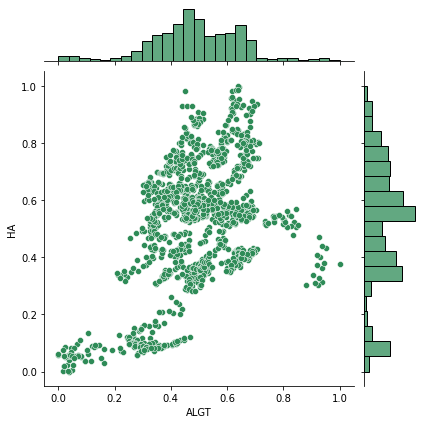

In [135]:
sns.jointplot(x='ALGT', y='HA', data=Aviation_set, kind='scatter', color='seagreen')
plt.show()

📝 
* If **p** value is close to **1** it means a higher positive correlation.
* If the p value is close to **-1** then it means the stock prices have a higher negative correlation.
* So we can conclude that **HA** and **ALGT** stock prices have a less positive correlation.

## Finance Sector

In [136]:
# Finance Stocks

Finance_Stocks=normalized_stocks[['S&P500','BCS','CS','DB','GS','MS','WFC']]

Finance_Stocks.head()

,S&P500,BCS,CS,DB,GS,MS,WFC
Date,,,,,,,
2015-10-01,0.054083,0.933166,0.903059,0.832608,0.296583,0.263568,0.666129
2015-10-02,0.069804,0.964912,0.931571,0.857143,0.303735,0.261687,0.661982
2015-10-05,0.090178,0.982456,0.958528,0.899090,0.330395,0.284793,0.688479
2015-10-06,0.086108,0.978279,0.969933,0.907004,0.327650,0.286674,0.679723
2015-10-07,0.095190,0.993317,0.966822,0.922438,0.341449,0.301988,0.683410


In [137]:
visual1(Finance_Stocks)
plt.show()

### Insight: 

- Due to Corona Pandemic hit in March 2020 Finance sector has also faced a major crisis and the sector has recovered a bit although majority of stocks has been hit.
- Morgan Stanley & Goldman Sachs have performed well when compared to other stocks.

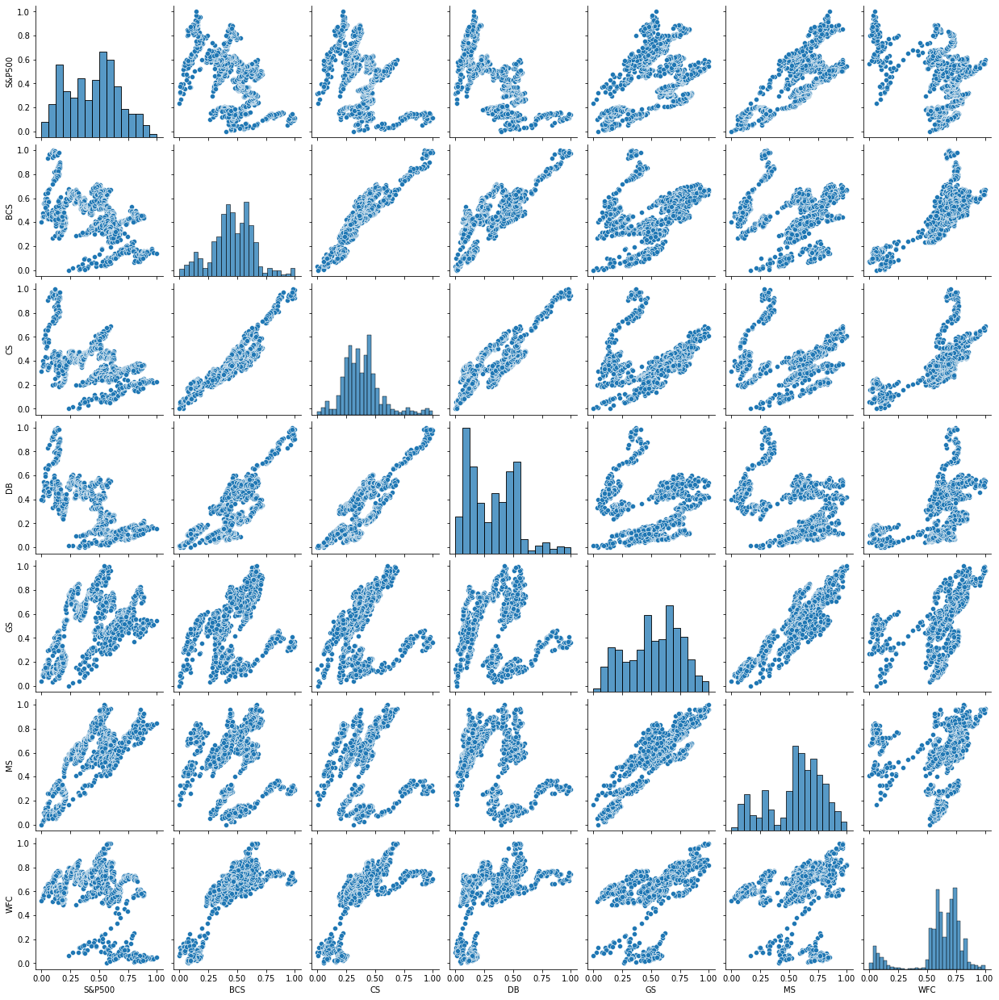

In [138]:
sns.pairplot(Finance_Stocks, kind = 'scatter')
plt.ioff()

Here we can see that Goldman Sachs & Morgan stanley are highly correlated when compared to others stocks

## Pharma Sector  

In [139]:
# Pharma Stocks

Pharma_Stocks = normalized_stocks[['S&P500','BHC','JNJ','MRK','PFE','RHHBY','UNH']]

In [140]:
Pharma_Stocks.head()

,S&P500,BHC,JNJ,MRK,PFE,RHHBY,UNH
Date,,,,,,,
2015-10-01,0.054083,0.984351,0.000000,0.017952,0.188839,0.333985,0.034410
2015-10-02,0.069804,1.000000,0.012191,0.035673,0.258737,0.338875,0.044761
2015-10-05,0.090178,0.891491,0.025505,0.060759,0.281285,0.344743,0.048585
2015-10-06,0.086108,0.906104,0.004010,0.027848,0.242390,0.349144,0.031799
2015-10-07,0.095190,0.928140,0.029034,0.054315,0.270575,0.301222,0.033571


In [141]:
visual1(Pharma_Stocks)

### Insight:

- Due to Corona Pandemic hit in March 2020 Pharma & Health care sector has also faced a major crisis and the recovery rate shown by this sector is commendable.
- United Health, Johnson & Johsnson have performed well when compared to S&P Index.
- Bausch Health is consistently performed very badly over the years when compared to other stocks in the same sector.

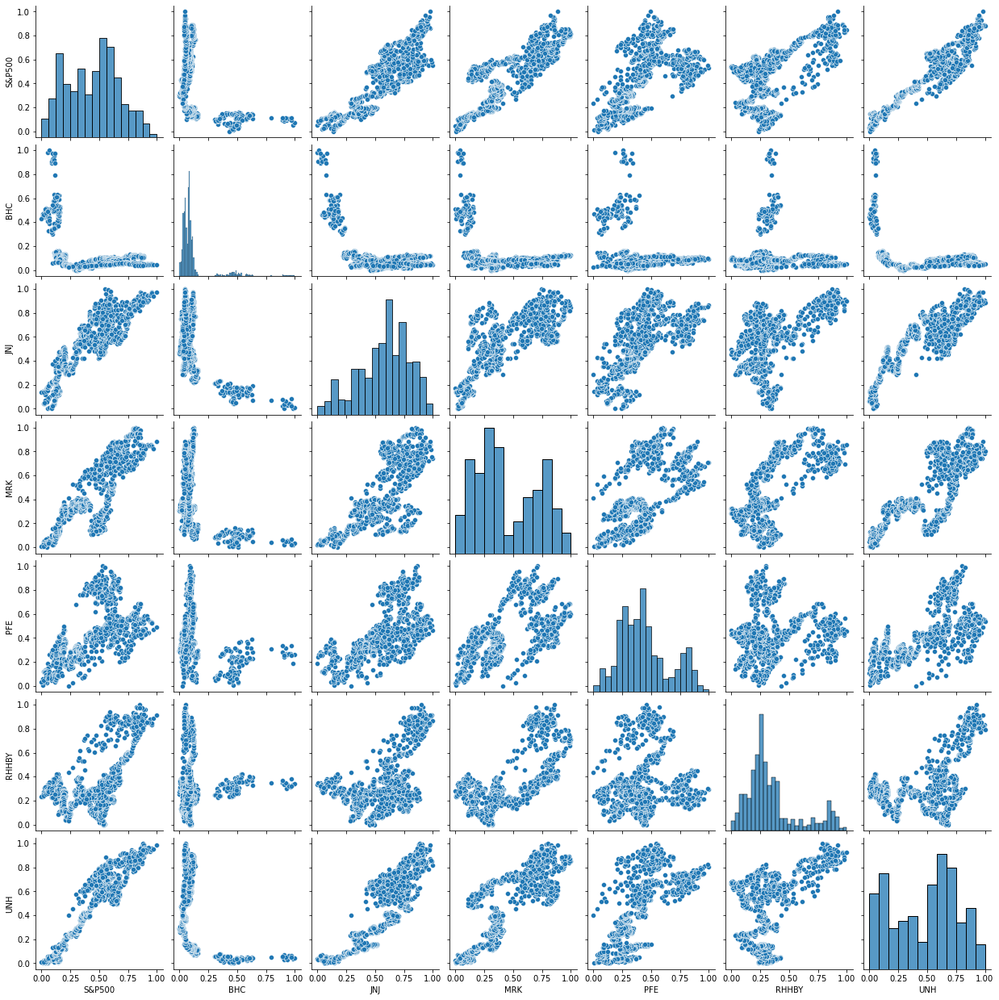

In [142]:
sns.pairplot(Pharma_Stocks)
plt.ioff()

## Technology Sector  

In [143]:
# Technology Stocks

Technology_Stocks = normalized_stocks[['S&P500','AAPL','AMZN','FB','GOOG','IBM','MSFT']]
Technology_Stocks.tail()

,S&P500,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,
2020-09-24,0.809192,0.767373,0.832209,0.744647,0.731430,0.267493,0.847840
2020-09-25,0.838802,0.803755,0.856915,0.769487,0.746354,0.277357,0.872594
2020-09-28,0.869137,0.827770,0.882796,0.778879,0.763865,0.309245,0.881255
2020-09-29,0.859929,0.819974,0.873230,0.802216,0.768172,0.300184,0.869600
2020-09-30,0.875645,0.835387,0.874493,0.802733,0.768413,0.308557,0.886014


In [144]:
visual1(Technology_Stocks)

### Insight: 

- Due to Covid Pandemic hit in March 2020 Technology Sector has also faced crisis but the recovery rate shown by this sector is commendable.
- Microsoft, Amazon, Apple, Facebook & Google have performed well along with Market index.
- The stock performed very badly over the years when compared to other stocks in the same sector is IBM.  

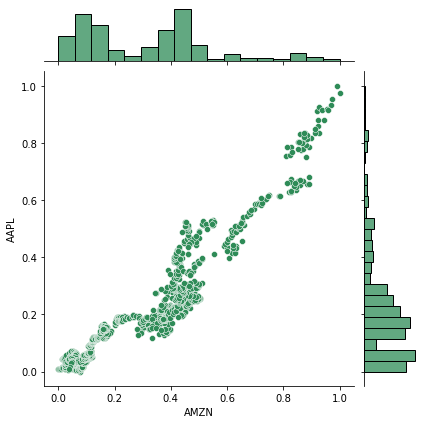

In [145]:
sns.jointplot(x='AMZN', y='AAPL', data=Technology_Stocks, kind='scatter', color='seagreen')
plt.show()

📝
* If p value is close to 1 it means higher positive correlation.
* If the p value is close to -1 then it means the stock prices have a higher negative correlation.
* So we can conclude that Apple and Amazon stock prices have a high positive correlation.

# Key Metrics 

## DAILY RETURNS

A return, also known as a financial return, in its simplest terms, is the money made or lost on an investment over some period of time.

- A return is a percentage defined as the change of price expressed as a fraction of the initial price.

- Returns exhibit more attractive statistical properties than asset prices themselves. Therefore, it also makes more statistical sense to analyze return data rather than price series.

We will use a formula and pandas built-in function pct_change to compute the simple returns for each day, each stock in our dataset.

In [146]:
# lets assign the dataset to daily_returns
daily_return = stocks.copy()

# using a loop function to calculate the percentage change

for i in list(daily_return.columns[:]):
    daily_return[i]=daily_return[i].pct_change(1)  # Percentage change between the current and a prior element

In [147]:
visual(daily_return)

In [148]:
correlated_stocks = daily_return.corr(method = 'pearson')

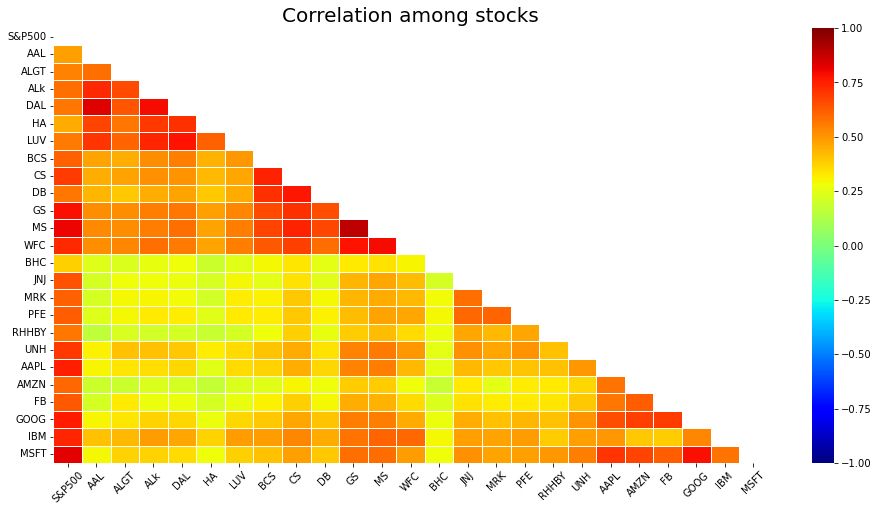

In [149]:
plt.figure(figsize=(16,8))
mask = np.zeros_like(correlated_stocks)
mask[np.triu_indices_from(mask)] = True
sns.heatmap(correlated_stocks, cmap='jet', vmax=1.0, vmin=-1.0 , mask = mask, linewidths=1.0)
plt.yticks(rotation=0) 
plt.xticks(rotation=45) 
plt.title('Correlation among stocks', fontsize = 20)
plt.show()

### Insight 

From the above Graph, we can understand that

- Microsoft & Google stocks are highly correlated in the Technology sector stocks.
- Goldman Sachs, Morgan Stanley & Wells Fargo are correlated in the Finance sector stocks.
- American Airlines & Delta Air Lines are more correlated than Alaska Air Group in the Aviation sector stocks.
- Pharma sector stocks are less correlated when compared to any other sector stocks.

In [150]:
# with the help of Plotly functions we will plot the graphs

# Note: Here we are ignoring the first column S&P500 as it is the market index

# lets define the function to plot the graph

def dispersion_plot(stocks, addAll = True):
    fig = go.Figure()

    for column in stocks.columns.to_list()[1:]:
        fig.add_trace(
            go.Histogram(
                x = stocks[column],
                name = column
            )
            
        )
# defining a "All" button to showcase all the stocks at a time
    button_all = dict(label = 'All',
                      method = 'update',
                      args = [{'visible': stocks.columns[1:].isin(stocks.columns.to_list()[1:]),
                               'title': 'All',
                               'showlegend':True}])
    
# defining the stocks button to showcase the individual stocks at a time
    def stocks_layout_button(column):
        return dict(label = column,
                    method = 'update',
                    args = [{'visible': stocks.columns[1:].isin([column]),
                             'title': column,
                             'showlegend': True}])
    
# after the selection of stock/slider has moved the graph has to be updated
    fig.update_layout(
        updatemenus=[go.layout.Updatemenu(
            active = 0,
            buttons = ([button_all] * addAll) + list(stocks.columns[1:].map(lambda column: stocks_layout_button(column)))
            )
        ])
    
# defining a slider option to increase or decrease the time period       
    fig.update_layout(title_text="Stock Price Dispersion from Mean",
                  xaxis_rangeslider_visible=True)
    fig.show()

    
#lets plot the graph
dispersion_plot(daily_return)


The graph shows how each of the stocks has been dispersed from the mean. We can see Dal and DB are the stocks which dispersed less than another stocks.

## Cummulative Daily Returns



In [151]:
# Lets Calculate the cumulative daily returns

df_cum_daily_return = (1 + daily_return).cumprod() - 1

df_cum_daily_return.tail()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-24,0.687575,-0.699745,-0.442609,-0.555029,-0.361154,-0.498585,-0.040354,-0.683544,-0.600664,-0.694193,0.108454,0.479683,-0.546656,-0.915256,0.552753,0.684221,0.123116,0.345575,1.509733,2.950356,4.799259,1.743595,1.336518,-0.177589,3.554808
2020-09-25,0.714537,-0.686480,-0.432241,-0.542565,-0.344197,-0.482410,-0.034106,-0.686875,-0.606476,-0.698341,0.107545,0.493333,-0.540435,-0.914811,0.563379,0.679765,0.132224,0.349187,1.594117,3.098558,4.943943,1.801759,1.363788,-0.171600,3.658597
2020-09-28,0.742159,-0.674490,-0.416873,-0.532095,-0.309844,-0.458957,-0.004426,-0.667555,-0.589041,-0.682127,0.130951,0.535873,-0.536936,-0.914978,0.578942,0.676322,0.142902,0.327815,1.600377,3.196386,5.095503,1.823749,1.395786,-0.152239,3.694911
2020-09-29,0.733775,-0.687500,-0.444490,-0.542939,-0.325919,-0.479984,-0.020828,-0.669554,-0.591947,-0.688160,0.117998,0.499683,-0.547823,-0.917149,0.578405,0.658902,0.135992,0.305539,1.608267,3.164628,5.039484,1.878395,1.403655,-0.157741,3.646043
2020-09-30,0.748085,-0.686480,-0.450408,-0.543438,-0.326580,-0.478771,-0.023692,-0.666223,-0.586135,-0.683258,0.141745,0.534921,-0.542963,-0.913474,0.597939,0.680170,0.152638,0.288682,1.673613,3.227414,5.046878,1.879604,1.404096,-0.152657,3.714862


In [152]:
# Since we calculated returns the first row for Returns and CumReturns will be null
# Delete the null rows as they are not relevant for our calculations

daily_return.dropna(axis = 0, inplace = True)
df_cum_daily_return.dropna(axis = 0, inplace = True)

In [153]:
daily_return.head()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2015-10-02,0.014315,-0.014541,-0.010964,-0.012090,-0.011892,-0.018196,-0.000781,0.025316,0.022831,0.023379,0.005624,-0.002222,-0.003499,0.015145,0.008157,0.015597,0.038945,0.003010,0.019038,0.007301,0.022699,0.012314,0.025553,0.006895,0.021520
2015-10-05,0.018290,0.040383,0.002180,0.020818,0.046579,0.050247,0.023971,0.013645,0.021104,0.039057,0.020846,0.027362,0.022435,-0.103444,0.008836,0.021739,0.012092,0.003601,0.006901,0.003624,0.020919,0.021071,0.023225,0.030848,0.023261
2015-10-06,-0.003588,-0.051256,-0.034527,-0.078853,-0.039821,-0.049020,-0.033079,-0.003205,0.008744,0.007092,-0.002103,0.002168,-0.007251,0.015539,-0.014141,-0.027913,-0.020609,0.002691,-0.030088,0.004784,-0.011404,-0.012871,0.006189,-0.001744,0.002573
2015-10-07,0.008036,0.030947,0.025120,0.019321,0.019960,0.012783,0.018684,0.011576,-0.002364,0.013732,0.010592,0.017614,0.003075,0.023072,0.016699,0.023092,0.015249,-0.029228,0.003274,-0.004761,0.008298,-0.004310,-0.004772,0.008805,0.001069
2015-10-08,0.008818,0.010939,-0.005518,-0.002764,-0.000652,0.062296,0.001292,0.005086,-0.031201,-0.013894,-0.006366,0.001822,0.006706,0.007890,0.001053,0.001374,-0.006008,0.021505,-0.003006,-0.011554,-0.016201,0.000758,-0.004982,0.014591,0.013889


In [154]:
df_cum_daily_return.tail()

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-24,0.687575,-0.699745,-0.442609,-0.555029,-0.361154,-0.498585,-0.040354,-0.683544,-0.600664,-0.694193,0.108454,0.479683,-0.546656,-0.915256,0.552753,0.684221,0.123116,0.345575,1.509733,2.950356,4.799259,1.743595,1.336518,-0.177589,3.554808
2020-09-25,0.714537,-0.686480,-0.432241,-0.542565,-0.344197,-0.482410,-0.034106,-0.686875,-0.606476,-0.698341,0.107545,0.493333,-0.540435,-0.914811,0.563379,0.679765,0.132224,0.349187,1.594117,3.098558,4.943943,1.801759,1.363788,-0.171600,3.658597
2020-09-28,0.742159,-0.674490,-0.416873,-0.532095,-0.309844,-0.458957,-0.004426,-0.667555,-0.589041,-0.682127,0.130951,0.535873,-0.536936,-0.914978,0.578942,0.676322,0.142902,0.327815,1.600377,3.196386,5.095503,1.823749,1.395786,-0.152239,3.694911
2020-09-29,0.733775,-0.687500,-0.444490,-0.542939,-0.325919,-0.479984,-0.020828,-0.669554,-0.591947,-0.688160,0.117998,0.499683,-0.547823,-0.917149,0.578405,0.658902,0.135992,0.305539,1.608267,3.164628,5.039484,1.878395,1.403655,-0.157741,3.646043
2020-09-30,0.748085,-0.686480,-0.450408,-0.543438,-0.326580,-0.478771,-0.023692,-0.666223,-0.586135,-0.683258,0.141745,0.534921,-0.542963,-0.913474,0.597939,0.680170,0.152638,0.288682,1.673613,3.227414,5.046878,1.879604,1.404096,-0.152657,3.714862


The last record of the dataframe multiplied by 100 gives us the percentage change of the stock prices for our entire period

In [155]:
#selecting the last row and assigning it to a data frame
Cum_daily_return = df_cum_daily_return.iloc[:, :].tail(1)

# lets round off the values by mulitplying with 100
Cum_daily_return = Cum_daily_return * 100

# lets check the dataframe
Cum_daily_return

,S&P500,AAL,ALGT,ALk,DAL,HA,LUV,BCS,CS,DB,GS,MS,WFC,BHC,JNJ,MRK,PFE,RHHBY,UNH,AAPL,AMZN,FB,GOOG,IBM,MSFT
Date,,,,,,,,,,,,,,,,,,,,,,,,,
2020-09-30,74.808459,-68.64796,-45.040827,-54.343762,-32.658005,-47.877072,-2.369175,-66.622252,-58.613533,-68.325792,14.174524,53.492057,-54.296267,-91.347439,59.793934,68.017012,15.263822,28.868151,167.361278,322.741369,504.68777,187.960421,140.40963,-15.265686,371.486208


In [ ]:
# Lets reset the index

Cum_daily_return = Cum_daily_return.reset_index()

# Lets transpose the dataframe 
Cum_daily_return = Cum_daily_return.transpose()

# Removing the date row & selecting only the stocks as per our requirement
Cum_daily_return = Cum_daily_return[1:]

# Renaming the column from Zero to Cumulative Returns
Cum_daily_return = Cum_daily_return.rename(columns = {0: 'Cumulative Returns'}, inplace = False)

# Sorting the values by descending order
Cum_daily_return = Cum_daily_return.sort_values('Cumulative Returns', ascending = False)

# lets check the dataframe
Cum_daily_return

In [ ]:
# changing the datatype to float from object
Cum_daily_return['Cumulative Returns'] = Cum_daily_return['Cumulative Returns'].astype(float, errors = 'raise')

# round off the values by 2 decimal points for easy refernce
Cum_daily_return = round(Cum_daily_return['Cumulative Returns'], 2)

# lets check the dataframe
Cum_daily_return

Here we can see Amazon, Microsoft and Apple are the best cumulative return stocks when compared with other stocks.

_________________________________________________________
## Calculation of Sharp Ratio, Annual Risk & Annual Returns

In [ ]:
daily_return.describe()

In [ ]:
# here we need mean and standard deviation of all the stocks 
df_daily_return = daily_return.describe()[1:8].T.sort_values('mean', ascending = False) # sorting the values by mean

# dropping the unnecessary columns
df = df_daily_return.drop(['25%', '50%', '75%'], axis = 1)

# Renaming the columns names 
df = df.rename(columns = {'mean': 'Avg Daily Returns', 'std':'Risk', "min": "Min", "max" : "Max" }, inplace = False)

# lets check the dataframe
df

In [ ]:
# Lets calculate Annualized Returns

# As per the industry practice here we take 252 days as the number of working days of a stock market 
df["Annualized_Returns"] = df["Avg Daily Returns"]*252

#Lets calculate Annualized risk

df["Annualized_Risk"] = np.sqrt(252) * df["Risk"]

# Lets Calculate the Sharpe Ratio

# here we are considering the risk free rate as 0.75%
df["Sharpe_Ratio"] = ((df["Annualized_Returns"] - 0.0075) / df["Annualized_Risk"]) / 100 #we have divided by 100 to cancel the roundoff 

# lets see the dataframe
df

In [ ]:
# lets round off the values by mulitplying with 100
df = df*100

# round off the values by 2 decimal points for easy refernce
df = round(df, 2)

# lets check the dataframe
df

In [ ]:
df_final = pd.concat([df, Cum_daily_return], axis=1)

df_final

### Insight: 

At the end of 5 years we can see that the top 8 stocks having returns of greater than 80% are as follows

- AMZN gives 40.59% annual returns
- MSFT gives 34.95% annual returns
- AAPL gives 33.32% annual returns
- FB gives 26.45% annual returns
- UNH gives 23.72% annual returns
- GOOG gives 21.02% annual returns
- MS gives 14.55% annual returns
- S&P500 gives 13.04% annual returns

In [ ]:
# df_final[0] = df_final[0].astype(float, errors = 'raise')
df_final.info()

In [ ]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Return")
sns.lineplot(data=df_final['Avg Daily Returns'], label="Daily Returns")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Vs Daily Return")

plt.show()

In [ ]:
# Line chart showing daily returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Avg Daily Returns'], label="Daily Returns")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Daily Returns")

plt.show()

We can see that Apple, Amazon, Facebook, Google, Micrososft, United health have given better daily returns.

In [ ]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=df_final['Sharpe_Ratio'], label="Sharpe_Ratio")

# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Daily Returns Vs Sharpe_Ratio")

plt.show()

In [ ]:
# Line chart showing Cumulative returns of stocks

plt.figure(figsize=(15,5))
sns.lineplot(data=df_final['Cumulative Returns']/100, label="Cumulative Daily Returns")
sns.lineplot(data=df_final['Sharpe_Ratio'], label="Sharpe_Ratio")
#sns.lineplot(data=df_final['Annualized_Risk'], label="Annualized_Risk")
sns.lineplot(data=df_final['Risk'], label="Risk")


# Add label for horizontal axis
plt.xlabel("Stocks")

#rotate the labels
plt.xticks(rotation = 90)

# Add label for horizontal axis
plt.ylabel("Cumulative Daily Returns Vs Sharpe_Ratio")

plt.show()

___________
# Portfolio Analysis 

## Patrick Jyengar Portfolio

Mr. Patrick Jyengar wants to double his investment in the span of 5 years. He wishes to invest in low-risk stocks which would fetch him decent returns.

As per his profile, Low-risk stocks like JNJ, RHHBY and MRK are suitable to invest in. But overall returns with these three stocks wouldn't reach the target what Mr. Patrick is investing for. So one portion of his wealth can be invested in MSFT to gain the desired returns.

Let's calculate the Risk and Returns associated with the above-mentioned portfolio.

In [ ]:
# Initial weight for each stock in order
stocks_data = ['MSFT', 'JNJ', 'RHHBY' ,'MRK']

initial_weight_stocks_df = np.array([0.25, 0.25, 0.25, 0.25])

In [ ]:
# Lets create a dataset for selected stocks
portfolio = stocks.copy()
portfolio = portfolio[stocks_data]

In [ ]:
portfolio.tail()

### Stock Return on Daily Basis

The percentage change in the price of the stock from the previous day is called Daily return . This can be calculated using the percentage change in the price on a daily basis.

In [ ]:
stocks_returns_d = portfolio.pct_change()
stocks_returns_d.head(8)

### Average daily Return of Stock

The average daily return for each stock can be calculated using the dataframe created above – “stocks_returns_d”

In [ ]:
avg_stocks_daily_returns = stocks_returns_d.mean()
print(avg_stocks_daily_returns)

We can see MSFT is the best performer stock.

### Risk of Stocks in Portfolio

In [ ]:
stock_risk= stocks_returns_d.std()
stock_risk

### Daily return from the portfolio

The weighted average can be calculated to determine the return from the portfolio daily.

In [ ]:
# Daily return from the portfolio

stocks_returns_d['portfolio_daily_return'] = stocks_returns_d.dot(initial_weight_stocks_df)
stocks_returns_d

### Total Portfolio Return

In [ ]:
allocated_stocks_daily_return = (initial_weight_stocks_df * avg_stocks_daily_returns)

portfolio_return = np.sum(allocated_stocks_daily_return)
portfolio_return*100

The Average Daily Returns of Portfolio is **0.06%**

In [ ]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
stocks_returns_d['portfolio_daily_return'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 15)
plt.xticks(rotation=0)
plt.xlabel("Year")
plt.show()

As we can see large variation in prices in the year 2018 and 2019 for the given portfolio.

### Cumulative Return from the Portfolio

The cumulative return of an investment is the cumulative gain or loss from an investment over the given period of time.

In [ ]:
# Cumulative return from the portfolio

daily_cumulative_return = (1+stocks_returns_d).cumprod()
daily_cumulative_return.tail(5)

It can be seen that this suggest that the portfolio has given cummulative return of 2.11 % in the given period.

In [ ]:
# Lets Plot the graph

plt.figure(figsize=(16,8))
plt.plot(daily_cumulative_return['portfolio_daily_return'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 20)
plt.show()

### Portfolio Risk – Portfolio Standard Deviation

For the portfolio standard deviation formula, we need three elements:

- Portfolio weight array.
- Portfolio covariance matrix
- Transpose of portfolio weight array


The weight for each stock in the portfolio is already available. We need to calculate the daily covariance. Remember, the covariance must be annualized by **multiplying with 252 (the trading days in a year)**.

In [ ]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio_s = stocks_returns_d.iloc[:,:-1]
covariance_matrix_portfolio_s = (covariance_matrix_portfolio_s.cov())*252

covariance_matrix_portfolio_s

In [ ]:
# Applying the matrix operations mentioned in the image above
portfolio_variance_s = np.dot(initial_weight_stocks_df.T,np.dot(covariance_matrix_portfolio_s, initial_weight_stocks_df))

In [ ]:
# Standard deviation (risk of portfolio)
portfolio_risk_s= np.sqrt(portfolio_variance_s)
portfolio_risk_s*100

### Sharp Ratio

In [ ]:
# Assuming that the risk free rate is zero
Sharpe_Ratio_S = (stocks_returns_d['portfolio_daily_return'].mean() - daily_return['S&P500'].mean()) / stocks_returns_d['portfolio_daily_return'].std()
Sharpe_Ratio_S

In [ ]:
Annualised_Sharpe_Ratio_S = (252**0.5)*Sharpe_Ratio_S
Annualised_Sharpe_Ratio_S

#### Total ROI from the Portfolio

In [ ]:
invested_amount=500000
Cummulative_return=daily_cumulative_return['portfolio_daily_return'][-1]
Expected_Return=invested_amount*Cummulative_return
Expected_Return

In [ ]:
Expected_Earning=Expected_Return-invested_amount
Expected_Earning

As Mr. Patrick jyengar invests 500 Thousand Dollar in equities, i.e., the above Portfolio. Returns that he would fetch after 5 years is 1.05 Million Dollar with 558.23 Thousand dollars of gain on investment.

## Peter Jyengar Portfolio

Mr. Peter Jyengar, on the other hand, consistent with his attitude towards risk, he prefers high-return investments. Does that believe he can still bounce back in case of any occasional losses? He wants to invest $1 million from the company's cash and cash equivalents in the most high-margin stocks, expects high returns within 5 years for inorganic expansion of his company. As per his profile, High risk/High Returns stocks like AMZN are suitable to invest in. Overall returns with these stocks would fetch him Maximum returns and also cater the Risk. Risk associated with the above-mentioned portfolio.

In [ ]:
# Initial weight for each stock in order
stock_data = ['AMZN']

stocks_initial_weight_df = np.array([1])

In [ ]:
# Lets create a dataset for selected stocks
portfolio_set = stocks.copy()
portfolio_set = portfolio_set[stock_data]

In [ ]:
portfolio_set.tail()

### Daily return from each stock

The percentage change in the price of the stock from the previous day is called Daily return . This can be calculated using the percentage change in the price on a daily basis.

In [ ]:
# Daily return from each stock 
stocks_returns = portfolio_set.pct_change()
stocks_returns.head(8)

### Average Daily return from the stock

The average daily return for each stock can be calculated using the dataframe created above – “stocks_returns_d”

In [ ]:
# Average daily return from each stock
mean_stocks_daily_return = stocks_returns.mean()
print(mean_stocks_daily_return)

### Risk of Stocks in portfolio

In [ ]:
stock_risk_s = stocks_returns.std()
stock_risk_s

### Daily Return from the portfolio 

The weighted average can be calculated to determine the return from the portfolio on a daily basis

In [ ]:
# Daily Return from the portfolio
stocks_returns['portfolio_daily_returns'] = stocks_returns.dot(stocks_initial_weight_df)
stocks_returns

### Total Portfolio Return

In [ ]:
# Portfolio daily returns


allocated_stocks_daily_returns = (stocks_initial_weight_df * mean_stocks_daily_return)

portfolio_return = np.sum(allocated_stocks_daily_returns)
portfolio_return*100

Average Daily Returns of Portfolio is 0.16%

In [ ]:
# Lets Plot the graph
plt.figure(figsize=(16,8))
stocks_returns['portfolio_daily_returns'].plot()
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 15)
plt.xticks(rotation=0)
plt.xlabel("Year")
plt.show()

In the above plot, the portfolio shows larger variation in prices from the end of 2017 to 2020.

### Cummulative Return from the Portfolio

The cumulative return of an investment is the cumulative gain or loss from an investment over the given period of time.

In [ ]:
# Cumulative return from the portfolio

daily_cumulative_return = (1+stocks_returns).cumprod()
daily_cumulative_return.tail(5)

This suggests that the portfolio has achieved a cumulative return of 5.04% in the given period

In [ ]:
# Lets Plot the graph

plt.figure(figsize=(16,8))
plt.plot(daily_cumulative_return['portfolio_daily_returns'], label = 'Daily Returns')
plt.title('Portfolio Daily Returns', fontsize = 20)
plt.legend(loc = 'best', fontsize = 20)
plt.show()

### Portfolio Risk – Portfolio Standard Deviation

For the portfolio standard deviation formula, we need three elements:
- Portfolio weight array.
- Portfolio covariance matrix.
- Transpose of portfolio weight array.

The weight for each stock in the portfolio is already available. We need to calculate the daily covariance. Remember, the covariance must be annualized by **multiplying with 252 (the trading days in a year)**.

In [ ]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.

covariance_matrix_portfolio = stocks_returns.iloc[:,:-1]
covariance_matrix_portfolio = (covariance_matrix_portfolio.cov())*252

covariance_matrix_portfolio

In [ ]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(stocks_initial_weight_df.T,np.dot(covariance_matrix_portfolio, stocks_initial_weight_df))

In [ ]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk*100

### Sharpe Ratio

In [ ]:
# Assuming that the risk free rate is zero
Sharpe_Ratio = (stocks_returns['portfolio_daily_returns'].mean() - daily_return['S&P500'].mean()) / stocks_returns['portfolio_daily_returns'].std()
Sharpe_Ratio

In [ ]:
Annualized_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualized_Sharpe_Ratio

#### Total ROI from the Portfolio

In [ ]:
#Total ROI from the Ratio

invested_amount=1000000
Cummulative_return=daily_cumulative_return['portfolio_daily_returns'][-1]
Expected_Return=invested_amount*Cummulative_return
Expected_Return

In [ ]:
Expected_Earning=Expected_Return-invested_amount
Expected_Earning

As Mr. Peter jyengar invests 1 Million Dollar in equities, i.e., the above Portfolio. The returns that he would receive after 5 years are beyond 6 million dollars, with a 5+ million dollar gain on investment.